* <font size="4">**Courses:** Fall 2022-IE 532-Analysis of Network Data</font> 
* <font size="4">**Topic:** Final project</font> 
* <font size="4">**Student name:**  Chen Wang</font> 

# Table of contents
1. <font size="4">[Chapter 1: Introduction(Background information)](#Introduction)</font>
2. <font size="4">[Chapter 2: Data-preprocessing](#preprocessing)</font>
3. <font size="4">[Chapter 3: Visualization](#Visualization)</font>
4. <font size="4">[Chapter 4 : problem 1--re-arranging Taichung city's district ](#Rearrangement)</font>
5. <font size="4">[Chapter 5 : problem 2-- Gerrymandering to benefit the winner(The Dpp party)](#Dpp)</font>
6. <font size="4">[Chapter 6 : problem 3-- Gerrymandering to benefit the loser(The KMT party)](#KMT)</font>
7. <font size="4">[Chapter 7 : Conclusion](#Conclusion)</font>

## Chapter 0: Overall powerpint: [powerpoint](https://docs.google.com/presentation/d/1MgxuIn3Qd3YQBER3RHAj5p41juCS7Udf/edit?usp=share_link&ouid=117434447847034760525&rtpof=true&sd=true)
You can review the PowerPoint directly.

## Chapter 1: Introduction(Background information)<a name="Introduction"></a>

<font size="4">**Gerrymandering:**</font>
- <font size="4">Given the evolving nature of communities, the reassignment of districts is crucial for upholding our democratic values.</font>
- <font size="4">It is imperative to redraw maps to ensure districts have equal populations, adhere to laws like the Voting Rights Act, and accurately represent a state’s population. [(Reference)](http://rportal.lib.ntnu.edu.tw:8080/server/api/core/bitstreams/b16a93bd-c5dd-43d8-8090-918fcfe47b0b/content)</font>
- <font size="4">Gerrymandering refers to the practice of manipulating electoral district boundaries to unfairly favor one political party over its rivals. [(Gerrymandering)](https://en.wikipedia.org/wiki/Gerrymandering)</font>

<font size="4"><strong>Taichung's Legislator Rearrangement:</strong></font>
- <font size="4">A redistribution of legislator districts is needed in Taichung. [(Reference)](http://rportal.lib.ntnu.edu.tw:8080/server/api/core/bitstreams/b16a93bd-c5dd-43d8-8090-918fcfe47b0b/content)</font>
- <font size="4">Certain districts in Taichung encompass residents with diverse needs, varying from coastal to inland areas. To address this, these areas should not be grouped together. [(Reference)](https://michaelturton.blogspot.com/2008/02/gerrymandering.html)</font>
- <font size="4">Our objective is to redistribute legislator districts in Taichung and present the outcomes under different conditions.</font>
- <font size="4">For your information, the Democratic Progressive Party (DPP) and the Kuomintang (KMT) are the two major political parties in Taiwan. <font color="green">DPP is represented by the color green</font>, <font color="blue">while KMT is represented by the color blue.</font> [(Taichung Legislative Background)](https://en.wikipedia.org/wiki/Legislative_Yuan_constituencies_in_Taichung_City)</font>
![2008-2022_Taichung's Legislator](Pictures/Taichung_legislative_conditions.png)


<font size="4">To enhance the intuitiveness of our project, we have aggregated data from smaller parties into either DPP or KMT categories based on their political tendencies.</font>

In [1]:
import numpy as np
import pandas as pd
import zipfile
import folium
import glob
import json
import folium
import io


import networkx as nx

from itertools import combinations
import math
import csv
from urllib.error import HTTPError
from collections import defaultdict


try:
    from gurobipy import *
except ModuleNotFoundError:
    print("!pip install gurobipy")
    !pip install gurobipy
    from gurobipy import *
    
try:
    import gdown
except ModuleNotFoundError:
    print("No module named 'gdown'")

import warnings
warnings.filterwarnings("ignore")

No module named 'gdown'


In [2]:
def open_google_file(file_id, filename):
    """
    Upload the file to the google colab.
    
    Parameters:
        - file_id: google drive link. ex: https://drive.google.com/file/d/ "file_id" /view?usp=drive_link
                ## file_id is between /file/d/ and /view?usp=drive_link
        - filename: csv file 
    """
    url = f'https://drive.google.com/uc?id={file_id}'
    gdown.download(url, filename, quiet=False)

In [3]:
# Try to get local version and then defaults to google drive version
# Can open a CSV file  
def get_file(location_pair, names = None, **kwargs):
    """
    Retrieve a file either locally or from Google Drive.

    Parameters:
    - location_pair (tuple): Tuple containing file location(s) and, if applicable, Google Drive link.
    - names (list): List of column names. Defaults to None.
    - **kwargs: Additional keyword arguments.

    Returns:
    - pd.DataFrame: Pandas DataFrame containing the data from the specified file.
    """
    try:
        out= pd.read_csv(location_pair)
    except FileNotFoundError:
        print("local file not found; accessing Google Drive")
        open_google_file('1Ep5lK7nNoa3DKJKnNQPz9vIQf2y0xS_D', location_pair)
        out= pd.read_csv(location_pair)
        
    return out

fname="Taiwan_Taichung_2018_legislator_election_distribution.csv"
Taichung = get_file(fname)
print(Taichung.shape)
Taichung.head()

(625, 5)


,legislator_district,district,village,DPP,KMT
0,1,大甲區,朝陽里,620,301
1,1,大甲區,大甲里,492,219
2,1,大甲區,順天里,755,341
3,1,大甲區,孔門里,311,176
4,1,大甲區,平安里,977,472


In [4]:
# Need to remove the \u3000
Taichung["district"][0]

'\u3000大甲區'

In [5]:
Taichung["district"] = Taichung["district"].apply(lambda x: x[1:]) ## remove "\u3000"
Taichung["bias"] = Taichung["DPP"] - Taichung["KMT"]  ## calculating the bias
Taichung["sum"] = Taichung["DPP"] + Taichung["KMT"] ## calculating the sum of Taichung votes

## Chapter 2: Data preprocessing<a name="preprocessing"></a>
- <font size="4">Check if has missing data (Will use dropna function to remove  the missing data, if there have, remove it!!)</font>

In [6]:
## Check if has missing data
Taichung.isnull().sum().to_frame()

,0
legislator_district,0
district,0
village,0
DPP,0
KMT,0
bias,0
sum,0


In [7]:
Taichung.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 625 entries, 0 to 624
Data columns (total 7 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   legislator_district  625 non-null    int64 
 1   district             625 non-null    object
 2   village              625 non-null    object
 3   DPP                  625 non-null    int64 
 4   KMT                  625 non-null    int64 
 5   bias                 625 non-null    int64 
 6   sum                  625 non-null    int64 
dtypes: int64(5), object(2)
memory usage: 34.3+ KB


In [8]:
## Move the "legislator_district" to be str from int (For the following step use)
Taichung["legislator_district"] = Taichung["legislator_district"].astype(str)
Taichung.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 625 entries, 0 to 624
Data columns (total 7 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   legislator_district  625 non-null    object
 1   district             625 non-null    object
 2   village              625 non-null    object
 3   DPP                  625 non-null    int64 
 4   KMT                  625 non-null    int64 
 5   bias                 625 non-null    int64 
 6   sum                  625 non-null    int64 
dtypes: int64(4), object(3)
memory usage: 34.3+ KB


In [9]:
'google.colab' in str(get_ipython())

False

In [10]:
# Important file 1:
# Aggrehgate Taichung_by_legislator_district data by the "legislator_district" column
try:
    # Read from the local file
    if 'google.colab' not in str(get_ipython()):
        Taichung_by_legislator_district = pd.read_pickle("Pickle/Taichung_by_legislator_district.pkl")
    # Read from the Google drive
    else:
        print("local file not found; accessing Google Drive")
        open_google_file("1XaOM20TEQaY-o72WhPb-cy4wiO60v2_S", "Taichung_by_legislator_district.pkl")
        Taichung_by_legislator_district = pd.read_pickle("Taichung_by_legislator_district.pkl")        
except FileNotFoundError:
    '''
    If the .pkl file is still not found, arrange the data locally.
    '''
    Taichung_by_legislator_district = Taichung.groupby("legislator_district").sum().reset_index()
    Taichung_by_legislator_district.to_pickle("Pickle/Taichung_by_legislator_district.pkl") 

print("Get Taichung_by_legislator_district file \033[1m\033[94mready\033[0m.\n")
Taichung_by_legislator_district.head()

Get Taichung_by_legislator_district file ready.



,legislator_district,DPP,KMT,bias,sum
0,1,106376,47050,59326,153426
1,2,112839,107766,5073,220605
2,3,90213,91182,-969,181395
3,4,119886,96460,23426,216346
4,5,114738,109466,5272,224204


In [11]:
# Get Taichung_by_legislator_district aggregation
try:
    # Read from the local file
    if 'google.colab' not in str(get_ipython()):
        Taichung_by_district = pd.read_pickle("Pickle/Taichung_by_district.pkl")
    # Read from the Google drive
    else:
        print("local file not found; accessing Google Drive")
        open_google_file("1KPqADKRMHTQ9-cjEOQfupBsU_NeHCotD", "Taichung_by_district.pkl")
        Taichung_by_district = pd.read_pickle("Taichung_by_district.pkl")          
except FileNotFoundError:
    Taichung_by_district = Taichung.groupby("district").sum()
    Taichung_by_district = Taichung_by_district.reset_index()
    Taichung_by_district = Taichung_by_district.rename_axis('node').reset_index()
    Taichung_by_district = pd.merge(Taichung_by_district, Taichung.iloc[:,0:2].drop_duplicates(), on = "district", how = "left")


    ## Inpute the distrcit English name
    translation2 = {'中區': 'Central Dist.', '北區': 'North Dist.', '北屯區': 'Beitun Dist.', '南區': 'South Dist.', 
                '南屯區': 'Nantun Dist.', '后里區': 'Houli Dist.', '和平區': 'Heping Dist.', '外埔區': 'Waipu Dist.', 
                '大安區': 'Daan Dist.', '大甲區': 'Dajia Dist.', '大肚區': 'Dadu Dist.', '大里區': 'Dali Dist.', 
                '大雅區': 'Daya Dist.', '太平區': 'Taiping Dist.', '新社區': 'Xinshe Dist.', '東勢區': 'Dongshi Dist.', 
                '東區': 'East Dist.', '梧棲區': 'Wuqi Dist.', '沙鹿區': 'Shalu Dist.', '清水區': 'Qingshui Dist.', 
                '潭子區': 'Tanzi Dist.', '烏日區': 'Wuri Dist.', '石岡區': 'Shigang Dist.', '神岡區': 'Shengang Dist.',
                '西區': 'West Dist.', '西屯區': 'Xitun Dist.', '豐原區': 'Fongyuan Dist.', '霧峰區': 'WuFong Dist.', 
                '龍井區': 'Longjing Dist.'}
    Taichung_by_district["translation"] = 0
    for i in range(Taichung_by_district.shape[0]):
        Taichung_by_district["translation"][i] = translation2[Taichung_by_district["district"][i]]

    Taichung_by_district["district2"] = Taichung_by_district["district"]
    Taichung_by_district = Taichung_by_district.set_index('district2')  
    Taichung_by_district.to_pickle("Pickle/Taichung_by_district.pkl") 


print("Get Taichung_by_district file \033[1m\033[94mready\033[0m.")
Taichung_by_district.head()

Get Taichung_by_district file ready.


,node,district,DPP,KMT,bias,sum,legislator_district,translation
district2,,,,,,,,
中區,0,中區,5617,3842,1775,9459,6,Central Dist.
北區,1,北區,39514,38272,1242,77786,5,North Dist.
北屯區,2,北屯區,75224,71194,4030,146418,5,Beitun Dist.
南區,3,南區,41568,31519,10049,73087,6,South Dist.
南屯區,4,南屯區,52398,39732,12666,92130,4,Nantun Dist.


### Geojson file resources:
- <font size="4">Downloaded the geojson [file](https://sheethub.com/ronnywang/%E4%B8%AD%E8%8F%AF%E6%B0%91%E5%9C%8B%E7%B8%A3%E5%B8%82)</font>
- <font size="4">Merge multi geojson files to one file for map drawing ([reference](https://blog.csdn.net/Ssbusbusbsubs/article/details/114855353)).</font>

In [12]:
## Arranging geojson file to contain Taichung districts only
try:
    # Read from the local file
    if 'google.colab' not in str(get_ipython()):    
        print("Check if Geo_json_file folder exists \033[1m\033[91mTaichung_json.json file\033[0m.")
        Taichung_json = json.load(open("Geo_json_file/Taichung_json.json", "r"))
        print("\033[1m\033[94mHave found\033[0m Taichung_json.json file.")
    # Read from the Google drive
    else:
        open_google_file("1L3Cmc9cbkAuc6dVZJ8QjMqJDLfhDoMQY", "Taichung_json.json")
        Taichung_json = json.load(open("Taichung_json.json", "r"))        
except FileNotFoundError:
    print("\033[1m\033[91mDid not\033[0m find Taichung_json.json file. Extract Taichung json file from \033[1m\033[95mTaiwan-village-boundaries.json\033[0m")
    Taiwan_geojson = json.load(open("Geo_json_file/Taiwan-village-boundaries.json", "r"))
    Taichung_json = Taiwan_geojson.copy()
    Taichung_json["features"] = []
    for i in range(len(Taiwan_geojson["features"])):
        if Taiwan_geojson["features"][i]["properties"]["C_Name"] == "臺中市":
            Taichung_json["features"].append(Taiwan_geojson["features"][i])

    # Output the combination of Taichung_json.json file.            
    with open("Geo_json_file/Taichung_json.json", "w", encoding = "utf-8") as outfile:
        json.dump(Taichung_json, outfile, ensure_ascii = False)

    del Taiwan_geojson

print("Get Taichung_json.json file \033[1m\033[94mready\033[0m.")

Check if Geo_json_file folder exists Taichung_json.json file.
Have found Taichung_json.json file.
Get Taichung_json.json file ready.


## Chapter 3: Visualization<a name="Visualization"></a>

In [13]:
data = Taichung_by_district.copy()
data.head()

,node,district,DPP,KMT,bias,sum,legislator_district,translation
district2,,,,,,,,
中區,0,中區,5617,3842,1775,9459,6,Central Dist.
北區,1,北區,39514,38272,1242,77786,5,North Dist.
北屯區,2,北屯區,75224,71194,4030,146418,5,Beitun Dist.
南區,3,南區,41568,31519,10049,73087,6,South Dist.
南屯區,4,南屯區,52398,39732,12666,92130,4,Nantun Dist.


In [14]:
# mapping scale. Define the scale into ten divisions
custom_scale = (data['bias'].quantile((0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1))).tolist()

# Create a map and define its location, map formation, and plotting scale
m = folium.Map([24.21 ,120.98],tiles='Stamen Terrain',     
                        zoom_start=10,
                        width="%80",
                        height="%80")
# Mapping parameters
cp = folium.Choropleth(
    data=data,
    geo_data=Taichung_json,
    nan_fill_color="black",
    line_weight=2,
    fill_color='PRGn',
    fill_opacity=0.7,
    line_opacity=0.5,
    name = Taichung_by_district["district"],
    threshold_scale=custom_scale,
    columns=['district', 'bias'],   
    legend_name='2018 Taichung legislation distribution',
    key_on='feature.properties.T_Name'
    ).add_to(m)


# Indexes marking reference: https://stackoverflow.com/questions/70471888/text-as-tooltip-popup-or-labels-in-folium-choropleth-geojson-polygons
for s in cp.geojson.data['features']:
    s['properties']['bias'] = str(data.loc[s["properties"]["T_Name"], 'bias'])
    s['properties']['sum'] = str(data.loc[s["properties"]["T_Name"], 'sum'])
    s['properties']['node'] = str(data.loc[s["properties"]["T_Name"], 'node'])
    s['properties']['translation'] = str(data.loc[s["properties"]["T_Name"], 'translation'])


# Mark indexes onto the map
folium.GeoJsonTooltip(["translation", 'T_Name', "node", "sum", "bias", ]).add_to(cp.geojson)

m

## Chapter 4 : problem 1-- re-arranging Taichung city's district<a name="Rearrangement"></a>

In [15]:
import networkx as nx

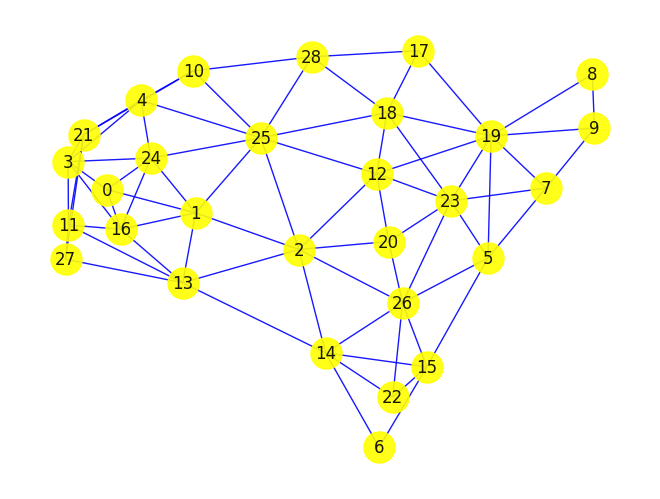

In [16]:
G=nx.Graph()
node_tuple = [(0,1),(0,3),(0,16),(0,24),(1,2),(1,13),(1,16),(1,24),(1,25),(2,12),(2,13),(2,14),(2,20),(2,25),(2,26),
              (3,4),(3,11),(3,16),(3,21),(3,24),(4,10),(4,21),(4,24),(4,25),(5,7),(5,15),(5,19),(5,23),(5,26),
              (6,14),(6,15),(7,9),(7,19),(7,23),(8,9),(8,19),(9,19),(10,21),(10,25),(10,28),(11,13),(11,16),(11,21),(11,27),
              (12,18),(12,19),(12,20),(12,23),(12,25),(13,14),(13,16),(13,27),(14,15),(14,22),(14,26),(15,22),(15,26),(16,24),
              (17,18),(17,19),(17,28),(18,19),(18,23),(18,25),(18,28),(19,23),(20,23),(20,26),(21,27),(22,26),(23,26),
              (24,25),(25,28)]
G.add_edges_from(node_tuple)


pos=nx.spring_layout(G)
nx.draw(G,pos, with_labels=True, node_size=500,  node_color='yellow', alpha = 0.9, edge_color = "blue")

In [17]:
def get_cluster_group_and_sum_pop(want_to_print_data = False):
    """
    Returns:
        1. cluster_group: clustering centers and their edges
        2. summary_pop: population across different clustering centers

    Parameters:
        - want_to_print_data: print the raw data from the Gurobi calculation

    Return types:
        - cluster_group: dictionary
        - summary_pop: dictionary
    """
    cluster_group = defaultdict(list) 
    summary_pop = defaultdict(int)
    sum_bias = defaultdict(int)
    
    if want_to_print_data:
        print("Center node:")
        for center in G.nodes():
            print(y_edges[(center,center)]) if y_edges[(center,center)].X == 1 else None
        print("\nEdge node:")  


    for center in G.nodes():
        for edge in G.nodes():
            if y_edges[(edge,center)].X == 1:
                cluster_group[center].append(edge)
                print(y_edges[(edge,center)]) if want_to_print_data else None 
    
    temp = G.nodes(data = True)
        
    for center, lis in cluster_group.items():
        for edge in lis:
            summary_pop[center] += temp[edge]["sum"]
            sum_bias[center] += temp[edge]["bias"]       
                   
    print("\nsummary_pop", summary_pop)
    print("sum_bias", sum_bias)
        
    return cluster_group, summary_pop

In [18]:
def classification(data, cluster_group, k_district):
    """
    Returns:
        - return the clustering classification data

    Parameters:
        - data: input data
        - cluster_group: clustering centers and their edges
        - k_district: population across different clustering centers
    """    
    data["classification"] = 0
    re_set_class = {key: (index+1)/k_district for index, key in enumerate(cluster_group.keys())}
       
    for edge in range(data.shape[0]):
        for center, nodes in cluster_group.items():
            if data["node"][edge] in nodes:
                data["classification"][edge] = re_set_class[center]
    
    return data

In [19]:
def draw_subgraph(cluster_group):
    """
    Returns:
        - Graph with clustering centers and their edge nodes

    Parameters:
        - cluster_group: clustering centers and their edges
    """     
    nx.draw(G,pos, with_labels=True, node_size=500,  node_color='yellow', alpha = 0.9, edge_color = "black", width=0.1)
    color = ["red", "gold", "greenyellow", "blue", "purple", "darkviolet", "deeppink", "crimson", "black", "turquoise"]
    for index, (_, cluster) in enumerate(cluster_group.items()):
        H = G.subgraph(cluster)
        T = nx.minimum_spanning_tree(H)
        ered=[(edge,center) for (edge,center) in T.edges()] 
        nx.draw_networkx_edges(G,pos,edgelist=ered, edge_color=color[index], width=5)

In [20]:
def geomap(data, geojson, mapping_vars, k_district = 8, colormap = 'RdYlBu', line_weight = 2):
    """
    Returns:
        Geo map with different district distributions

    Parameters:
        - data: input data
        - geojson: target map's latitude and longitude
        - mapping_vars: column based on which to classify
        - k_district: population across different clustering centers
        - colormap: map of district distributions
        - line_weight: weight of the map's boundary lines
    """     
    data1 = data.copy()
    if mapping_vars == "legislator_district":
        data1["legislator_district"] = data["legislator_district"].astype(int)/k_district
    
    m = folium.Map([24.21 ,120.98],tiles='Stamen Terrain',     
                        zoom_start=10,
                        width="%80",
                        height="%80")
    
    
    if k_district > 2:
        
        custom_scale = list(np.linspace(min(data1[mapping_vars]), max(data1[mapping_vars]), k_district+1, endpoint = True))
        
        cp = folium.Choropleth(
        data=data1,
        geo_data=geojson,
        nan_fill_color="black",
        line_weight=line_weight,
        fill_color= colormap,
        fill_opacity=0.7,
        line_opacity=1,
        threshold_scale=custom_scale,
        name = data1["district"],
        columns=['district', mapping_vars],   
        legend_name='2018 Taichung legislation distribution k = {}.'.format(k_district),
        key_on='feature.properties.T_Name'
        ).add_to(m)
    
    else:
        cp = folium.Choropleth(
        data=data,
        geo_data=Taichung_json,
        nan_fill_color="black",
        line_weight=line_weight,
        fill_color= colormap,
        fill_opacity=0.7,
        line_opacity=1,
        name = data1["district"],
        columns=['district', mapping_vars],   
        legend_name='2018 Taichung legislation distribution k = {}.'.format(k_district),
        key_on='feature.properties.T_Name'
        ).add_to(m)
    
    # Indexes marking reference: https://stackoverflow.com/questions/70471888/text-as-tooltip-popup-or-labels-in-folium-choropleth-geojson-polygons
    for s in cp.geojson.data['features']:
        s['properties']['bias'] = str(data1.loc[s["properties"]["T_Name"], 'bias'])
        s['properties']['sum'] = str(data1.loc[s["properties"]["T_Name"], 'sum'])
        s['properties']['node'] = str(data1.loc[s["properties"]["T_Name"], 'node'])
        s['properties']['translation'] = str(data.loc[s["properties"]["T_Name"], 'translation'])
        s['properties'][mapping_vars] = str(data.loc[s["properties"]["T_Name"], mapping_vars])


    # Mark indexes onto the map
    folium.GeoJsonTooltip(["translation", 'T_Name', "node", "sum", "bias", mapping_vars]).add_to(cp.geojson)
    
    return m

In [21]:
if 'google.colab' not in str(get_ipython()):
    Taichung_by_district = pd.read_pickle("Pickle/Taichung_by_district.pkl")
    Taichung_by_legislator_district = pd.read_pickle("Pickle/Taichung_by_legislator_district.pkl")
    Taichung_json = json.load(open("Geo_json_file/Taichung_json.json", "r"))
else:
    Taichung_by_district = pd.read_pickle("Taichung_by_district.pkl")
    Taichung_by_legislator_district = pd.read_pickle("Taichung_by_legislator_district.pkl")
    Taichung_json = json.load(open("Taichung_json.json", "r"))
    

data = Taichung_by_district.copy()


k_district=7
avg_pop = sum(data["sum"])/k_district
tolerance = 0.2

In [22]:
if data.keys()[4] == "bias" and data.keys()[5] == "sum":
    for index,d in G.nodes(data = True):
        for j in range(data.shape[0]):
            if data.iloc[j,0] == index: ## if data node equal to the G.node
                d["sum"] = data.iloc[j,5]
                d["bias"] = data.iloc[j,4]
else:
    print("Please check data, data is uncorrect.")

In [23]:
distance = {}
for i in G.nodes():
    for j in G.nodes():
        distance[(i,j)] = nx.shortest_path_length(G, i, j)

### Define variables:

<font size="4">$$\text{Define}~~y_{i,j} ~\forall \left(i,j\right)\in V$$
$$y_{i,i} \in\left\{0,1\right\}  \text{{1, if parcel i is the center of the nodes, 0, others}}$$
$$y_{i,j} \in\left\{0,1\right\}  \text{{1, if parcel i is assigned to parcel j, 0, others}}$$</font>

<font size="4">**Reminder:**</font> 
- <font size="4">directed path $y_{ij}$ (respectively, $y_{ji}$) means **from i to j (respectively from j to i)** can not be equal.</font>

In [24]:
model = Model("Taichung_re-distribution")
y_edges = {}

for i in G.nodes():
    for j in G.nodes():
        y_edges[(i,j)] =model.addVar(vtype=GRB.BINARY, name='y_edges('+str(i)+','+str(j)+')')

Set parameter Username
Academic license - for non-commercial use only - expires 2024-02-19


### Define constraint:

<font size="4">$$~~\sum_{i\in V} y_{ii} = k$$</font> 

In [25]:
# Add constraint xii
expr = 0
for center in G.nodes():
    expr += y_edges[(center,center)]
model.addConstr(expr == k_district)

<gurobi.Constr *Awaiting Model Update*>

### Define constraint:

<font size="4">$$~~\sum_{i\in V,j\in V} y_{ij} = 1 \text{(from i to j)}$$</font> 

<font size="4">**Reminder:**</font> 
<font size="4">Control i, changing j node, there will have 4 conditions:
<blockquote>
    <b> Condition1:</b> if <b>i</b> is a center node, and <b>j1</b> is a center node: 
    $$ y_{ii} = 1, y_{ij_{1}} = 0 $$
    <b> Condition2:</b> if <b>i</b> is a center node, and <b>j2</b> is a edge node: 
    $$ y_{ij_{2}} = 0 $$
    Therefore, combined <b>Condition1</b> and <b>Condition2</b>:
    $$~~\sum_{i\in V,j\in V} y_{ij} = y_{ii} + y_{ij_{1}} + y_{ij_{2}}+.... = 1 \text{(i is a center node)}$$
    <b> Condition3:</b> if <b>i</b> is a edge node, and <b>j1</b> is a center node: 
    $$ y_{ii} = 0, y_{ij_{1}} = 1$$
    <b> Condition4:</b> if <b>i</b> is a edge node, and <b>j2</b> is a edge node: 
    $$ y_{ij_{2}} = 0 $$
    Therefore, combined <b>Condition3</b> and <b>Condition4</b>:
    $$~~\sum_{i\in V,j\in V} y_{ij} = y_{ii} + y_{ij_{1}} + y_{ij_{2}}+.... = 1 \text{(i is a edge node)}$$
<blockquote></font> 

In [26]:
for center in G.nodes():
    tail_to_head = 0
    for edge in G.nodes():
            tail_to_head += y_edges[(center,edge)]
    model.addConstr(tail_to_head == 1)

### Define constraint:

<font size="4">$$~~\sum_{i\in V,j\in V} y_{ij} \leq y_{jj} \text{(from i to j)}$$</font> 

<font size="4">**Reminder:**</font> 
<font size="4">Control j, changing i node, there will have 4 conditions:
<blockquote>
    <b> Condition1:</b> if <b>i1</b> is a center node, and <b>j</b> is a center node: 
    $$ y_{i_{1}j} = 0, y_{jj} = 1 $$
    <b> Condition2:</b> if<b>i2</b> is a edge node, and <b>j</b> is a center node: 
    $$ y_{i_{2}j} = 1 $$
    Therefore, combined <b>Condition1</b> and <b>Condition2</b>:
    $$~~ 0 = y_{i_{1}j} = y_{i_{3}j} = .... \leq y_{i_{2}j} = y_{jj} = 1 \text{(j is a center node)}$$
    <b> Condition3:</b> <b>i</b> is a center node, and <b>j</b> is a edge node: 
    $$ y_{i_{1}j} = 0, y_{jj} = 0 $$
    <b> Condition4:</b> <b>i2</b> is a edge node, and <b>j</b> is a edge node: 
    $$ y_{i_{2}j} = 0 $$
    Therefore, combined <b>Condition3</b> and <b>Condition4</b>:
    $$~~ y_{i_{1}j} = y_{i_{3}j} = .... = y_{i_{2}j} = y_{jj} = 0 \text{(j is a edge node)}$$
<blockquote></font> 

In [27]:
for center in G.nodes():
    for edge in G.nodes():
            model.addConstr(y_edges[(edge,center)] <= y_edges[(center,center)])

### Define constraint:
<font size="4">**Reminder:**</font> 
- <font size="4">Control j, changing i node, summarize the distance (because distance is located at node j)</font> 
<font size="4">$$~~\sum_{i\in V, j\in V} y_{ij}distance_{i} \leq (\frac{population}{k_{district}})( 1 + tolerance)y_{jj}$$ 
$$~~\sum_{i\in V, j\in V} y_{ij}distance_{i} \geq (\frac{population}{k_{district}})( 1 - tolerance)y_{jj}$$</font> 

In [28]:
# Add constraint yii tolerance
for j in G.nodes():
    summary = 0
    for i,d1 in G.nodes(data = True):
            summary += y_edges[(i,j)]*d1["sum"]
    model.addConstr(summary <= avg_pop*(1 + tolerance)*y_edges[(j,j)])
    model.addConstr(summary >= avg_pop*(1 - tolerance)*y_edges[(j,j)])

### Define objective function:
<font size="4">**Reminder:**</font>
- <font size="4">summarize the shortest path from i to j</font>  
<font size="4">$$\text{min}~~\sum_{i\in V, j\in V} y_{ij}distance_{i,j} $$</font>  

In [29]:
obj = 0
for i in G.nodes():
    for j in G.nodes():
        obj += distance[(i,j)]*y_edges[(i,j)]
model.setObjective(obj, GRB.MINIMIZE)

In [30]:
model.write("test2.lp")
model.optimize()
obj_7 = obj.getValue()
print(obj_7)

Gurobi Optimizer version 10.0.1 build v10.0.1rc0 (win64)

CPU model: 11th Gen Intel(R) Core(TM) i7-11800H @ 2.30GHz, instruction set [SSE2|AVX|AVX2|AVX512]
Thread count: 8 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 929 rows, 841 columns and 4176 nonzeros
Model fingerprint: 0x2d23fba8
Variable types: 0 continuous, 841 integer (841 binary)
Coefficient statistics:
  Matrix range     [1e+00, 3e+05]
  Objective range  [1e+00, 5e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 7e+00]
Presolve removed 116 rows and 2 columns
Presolve time: 0.02s
Presolved: 813 rows, 839 columns, 4414 nonzeros
Variable types: 0 continuous, 839 integer (839 binary)
Found heuristic solution: objective 46.0000000

Root relaxation: objective 2.200000e+01, 133 iterations, 0.00 seconds (0.00 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0

In [31]:
cluster_group, summary_pop = get_cluster_group_and_sum_pop(want_to_print_data = False)


summary_pop defaultdict(<class 'int'>, {1: 262270, 3: 210742, 25: 259116, 12: 258365, 11: 205753, 15: 188893, 19: 191202})
sum_bias defaultdict(<class 'int'>, {1: 44256, 3: 25348, 25: 11800, 12: -69, 11: 50525, 15: -31565, 19: 61742})


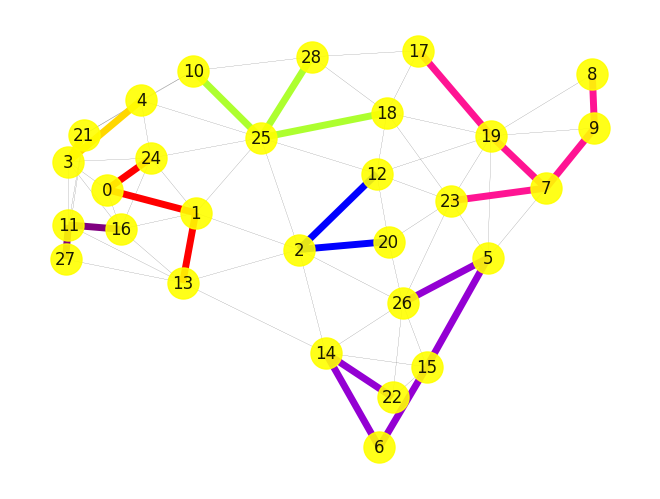

In [32]:
draw_subgraph(cluster_group)

In [33]:
Taichung_7_dis = classification(data, cluster_group, 7)

### k_district = 8

In [62]:
def gurobi_sol_calculation(data, k_district=8, tolerance =0.1, want_to_print_model= False, want_to_print_data = True, 
                           want_to_draw_subgraph = True):
    """
    Returns:
        Uses the Gurobi Optimizer to determine the best distribution based on the defined criteria
    Parameters:
        - data: input data
        - geojson: target map's latitude and longitude
        - mapping_vars: column based on which to classify
        - k_district: population across different clustering centers
        - colormap: map of district distributions
        - line_weight: weight of the map's boundary lines
    """
    data1 = data.copy()
    if "sum" in data1.keys():
        avg_pop = sum(data1["sum"])/k_district
    else:
        print("No 'sum' column. Please check.")
    
    distance = {}
    for i in G.nodes():
        for j in G.nodes():
            distance[(i,j)] = nx.shortest_path_length(G, i, j)
    
    global model
    model = Model("Taichung_re-distribution")
    
    
    global y_edges
    y_edges = {}

    for i in G.nodes():
        for j in G.nodes():
            y_edges[(i,j)] =model.addVar(vtype=GRB.BINARY, name='y_edges('+str(i)+','+str(j)+')')

    # Add constraint yii
    expr = 0
    for center in G.nodes():
        expr += y_edges[(center,center)]
    model.addConstr(expr == k_district)

    for center in G.nodes():
        tail_to_head = 0
        for edge in G.nodes():
                tail_to_head += y_edges[(center,edge)]
        model.addConstr(tail_to_head == 1)

    for center in G.nodes():
        for edge in G.nodes():
                model.addConstr(y_edges[(edge,center)] <= y_edges[(center,center)])
                
                
    # Add constraint yii tolerance
    for center in G.nodes():
        summary = 0
        for edge,d1 in G.nodes(data = True):
                summary += y_edges[(edge,center)]*d1["sum"]
        model.addConstr(summary <= avg_pop*(1 + tolerance)*y_edges[(center,center)])
        model.addConstr(summary >= avg_pop*(1 - tolerance)*y_edges[(center,center)])
        
    
    obj = 0
    for edge in G.nodes():
        for center in G.nodes():
            obj += distance[(edge,center)]*y_edges[(edge,center)]
    model.setObjective(obj, GRB.MINIMIZE)
    
    
    if want_to_print_model:
        model.display()
        
    model.optimize()
    
    cluster_group, summary_pop = get_cluster_group_and_sum_pop(want_to_print_data)
    
    if want_to_draw_subgraph:
        draw_subgraph(cluster_group)
    
    Taichung_dis = classification(data1, cluster_group, k_district)
    
    return Taichung_dis, obj.getValue()

Gurobi Optimizer version 10.0.1 build v10.0.1rc0 (win64)

CPU model: 11th Gen Intel(R) Core(TM) i7-11800H @ 2.30GHz, instruction set [SSE2|AVX|AVX2|AVX512]
Thread count: 8 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 929 rows, 841 columns and 4176 nonzeros
Model fingerprint: 0x9b12805e
Variable types: 0 continuous, 841 integer (841 binary)
Coefficient statistics:
  Matrix range     [1e+00, 2e+05]
  Objective range  [1e+00, 5e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 8e+00]
Presolve removed 178 rows and 12 columns
Presolve time: 0.01s
Presolved: 751 rows, 829 columns, 4621 nonzeros
Variable types: 0 continuous, 829 integer (829 binary)
Found heuristic solution: objective 54.0000000

Root relaxation: objective 2.100000e+01, 97 iterations, 0.00 seconds (0.00 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0

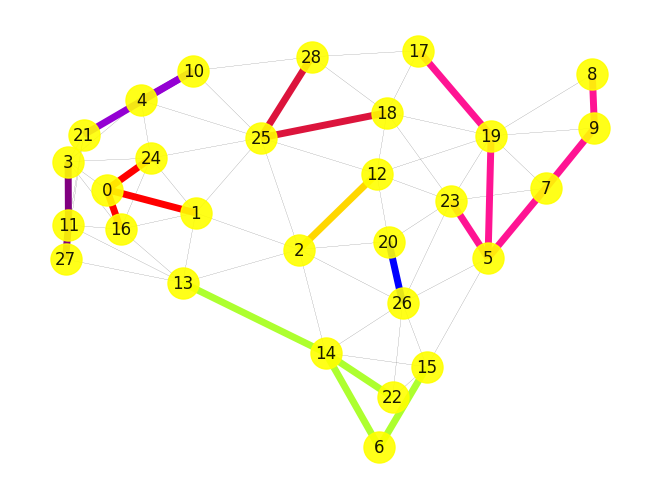

In [61]:
k_district=8
tolerance =0.2
Taichung_8_dis, obj_8 = gurobi_sol_calculation(data, k_district, tolerance, want_to_print_model= False, 
                                               want_to_print_data = False, want_to_draw_subgraph = True)

Gurobi Optimizer version 10.0.1 build v10.0.1rc0 (win64)

CPU model: 11th Gen Intel(R) Core(TM) i7-11800H @ 2.30GHz, instruction set [SSE2|AVX|AVX2|AVX512]
Thread count: 8 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 929 rows, 841 columns and 4176 nonzeros
Model fingerprint: 0x71ec1126
Variable types: 0 continuous, 841 integer (841 binary)
Coefficient statistics:
  Matrix range     [1e+00, 3e+05]
  Objective range  [1e+00, 5e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 6e+00]
Presolve removed 62 rows and 0 columns
Presolve time: 0.01s
Presolved: 867 rows, 841 columns, 4212 nonzeros
Variable types: 0 continuous, 841 integer (841 binary)
Found heuristic solution: objective 37.0000000

Root relaxation: objective 2.300000e+01, 135 iterations, 0.00 seconds (0.00 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

H    0 

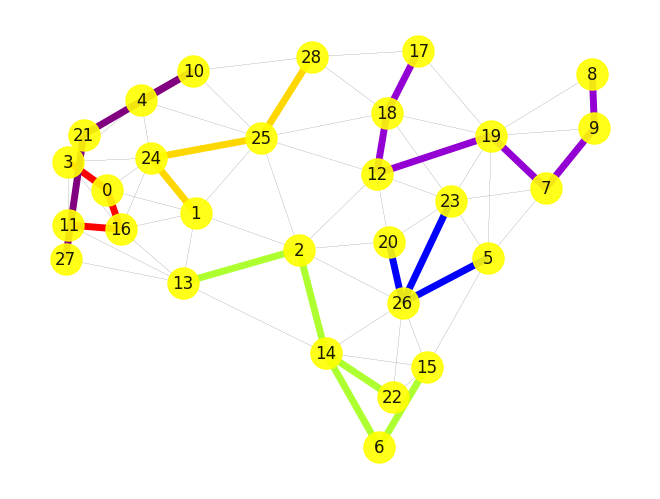

In [63]:
k_district=6
tolerance =0.2
Taichung_6_dis, obj_6 = gurobi_sol_calculation(data, k_district, tolerance, want_to_print_model= False, 
                                               want_to_print_data = False, want_to_draw_subgraph = True)

Gurobi Optimizer version 10.0.1 build v10.0.1rc0 (win64)

CPU model: 11th Gen Intel(R) Core(TM) i7-11800H @ 2.30GHz, instruction set [SSE2|AVX|AVX2|AVX512]
Thread count: 8 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 929 rows, 841 columns and 4176 nonzeros
Model fingerprint: 0x71801835
Variable types: 0 continuous, 841 integer (841 binary)
Coefficient statistics:
  Matrix range     [1e+00, 4e+05]
  Objective range  [1e+00, 5e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 5e+00]
Presolve removed 33 rows and 0 columns
Presolve time: 0.01s
Presolved: 896 rows, 841 columns, 4174 nonzeros
Variable types: 0 continuous, 841 integer (841 binary)
Found heuristic solution: objective 33.0000000

Root relaxation: objective 2.500000e+01, 209 iterations, 0.00 seconds (0.00 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

H    0 

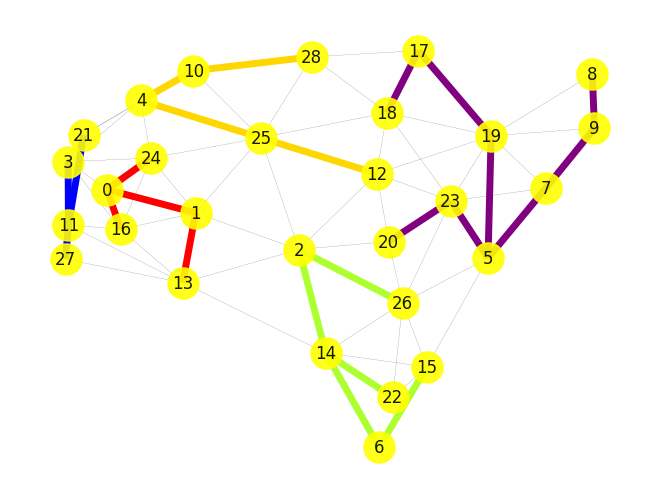

In [64]:
k_district=5
tolerance =0.2
Taichung_5_dis, obj_5 = gurobi_sol_calculation(data, k_district, tolerance, want_to_print_model= False, 
                                               want_to_print_data = False, want_to_draw_subgraph = True)

Gurobi Optimizer version 10.0.1 build v10.0.1rc0 (win64)

CPU model: 11th Gen Intel(R) Core(TM) i7-11800H @ 2.30GHz, instruction set [SSE2|AVX|AVX2|AVX512]
Thread count: 8 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 929 rows, 841 columns and 4176 nonzeros
Model fingerprint: 0x5aaf31d1
Variable types: 0 continuous, 841 integer (841 binary)
Coefficient statistics:
  Matrix range     [1e+00, 5e+05]
  Objective range  [1e+00, 5e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 4e+00]
Presolve removed 29 rows and 0 columns
Presolve time: 0.01s
Presolved: 900 rows, 841 columns, 4176 nonzeros
Variable types: 0 continuous, 841 integer (841 binary)
Found heuristic solution: objective 41.0000000

Root relaxation: objective 2.700000e+01, 205 iterations, 0.00 seconds (0.00 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0 

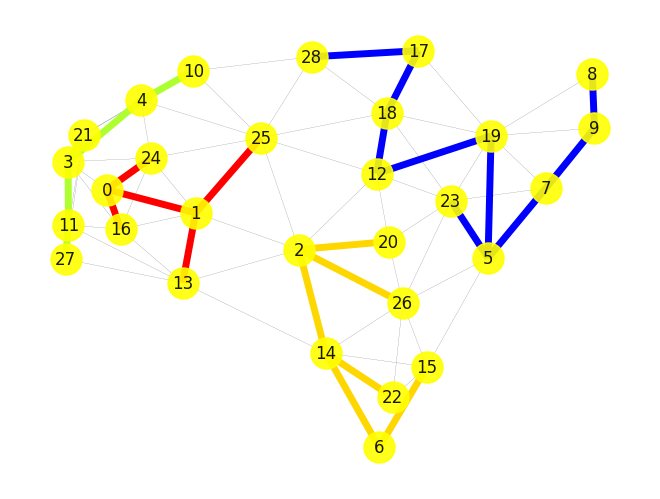

In [38]:
k_district=4
tolerance =0.2
Taichung_4_dis, obj_4 = gurobi_sol_calculation(data, k_district, tolerance, want_to_print_model= False, 
                                               want_to_print_data = False, want_to_draw_subgraph = True)

Gurobi Optimizer version 10.0.1 build v10.0.1rc0 (win64)

CPU model: 11th Gen Intel(R) Core(TM) i7-11800H @ 2.30GHz, instruction set [SSE2|AVX|AVX2|AVX512]
Thread count: 8 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 929 rows, 841 columns and 4176 nonzeros
Model fingerprint: 0x519c7467
Variable types: 0 continuous, 841 integer (841 binary)
Coefficient statistics:
  Matrix range     [1e+00, 6e+05]
  Objective range  [1e+00, 5e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 3e+00]
Presolve removed 29 rows and 0 columns
Presolve time: 0.01s
Presolved: 900 rows, 841 columns, 4176 nonzeros
Variable types: 0 continuous, 841 integer (841 binary)
Found heuristic solution: objective 45.0000000

Root relaxation: objective 3.200000e+01, 319 iterations, 0.00 seconds (0.00 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

*    0 

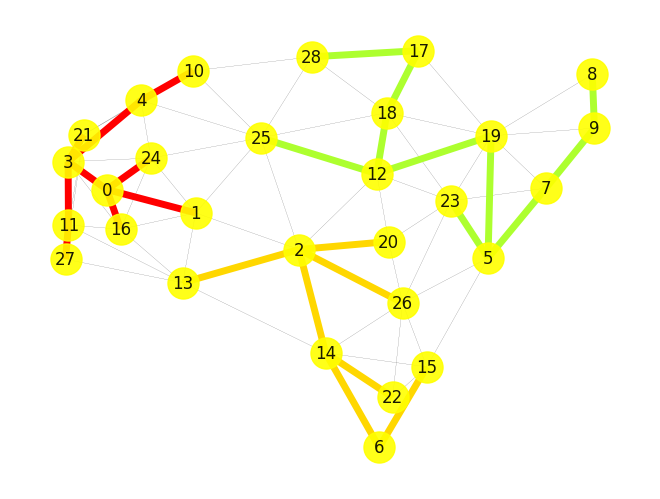

In [39]:
k_district=3
tolerance =0.2
Taichung_3_dis, obj_3 = gurobi_sol_calculation(data, k_district, tolerance, want_to_print_model= False, 
                                               want_to_print_data = False, want_to_draw_subgraph = True)

Gurobi Optimizer version 10.0.1 build v10.0.1rc0 (win64)

CPU model: 11th Gen Intel(R) Core(TM) i7-11800H @ 2.30GHz, instruction set [SSE2|AVX|AVX2|AVX512]
Thread count: 8 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 929 rows, 841 columns and 4176 nonzeros
Model fingerprint: 0xd83325d6
Variable types: 0 continuous, 841 integer (841 binary)
Coefficient statistics:
  Matrix range     [1e+00, 9e+05]
  Objective range  [1e+00, 5e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+00]
Presolve removed 29 rows and 0 columns
Presolve time: 0.01s
Presolved: 900 rows, 841 columns, 4176 nonzeros
Variable types: 0 continuous, 841 integer (841 binary)
Found heuristic solution: objective 58.0000000

Root relaxation: objective 4.196922e+01, 520 iterations, 0.01 seconds (0.01 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0 

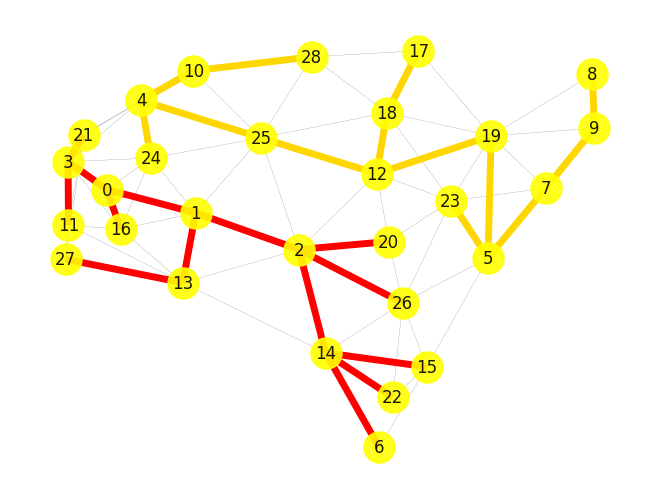

In [40]:
k_district=2
tolerance =0.2
Taichung_2_dis, obj_2 = gurobi_sol_calculation(data, k_district, tolerance, want_to_print_model= False, 
                                               want_to_print_data = False, want_to_draw_subgraph = True)

### k_district = 8

In [41]:
k_district = 8
geomap(Taichung_8_dis, Taichung_json, "classification", k_district, colormap = 'RdYlBu', line_weight = 2)

### k_district = 7

In [42]:
k_district = 7
geomap(Taichung_7_dis, Taichung_json, "classification", k_district, line_weight = 2)

### k_district = 6

In [43]:
k_district = 6
geomap(Taichung_6_dis, Taichung_json, "classification", k_district, line_weight = 2)

### k_district = 5

In [44]:
k_district = 5
geomap(Taichung_5_dis, Taichung_json, "classification", k_district, line_weight = 2)

### k_district = 4

In [45]:
k_district = 4
geomap(Taichung_4_dis, Taichung_json, "classification", k_district, line_weight = 2)

### k_district = 3

In [46]:
k_district = 3
geomap(Taichung_3_dis, Taichung_json, "classification", k_district, line_weight = 2)

### k_district = 2

In [47]:
k_district = 2
geomap(Taichung_2_dis, Taichung_json, "classification", k_district, line_weight = 2)

### Comparison: Compared with current Taichung's legislator distribution

In [48]:
k_district = 8
geomap(Taichung_8_dis, Taichung_json, "legislator_district", k_district, colormap = 'RdYlBu')

In [49]:
max_of_current_district = round((max(Taichung_by_district.groupby("legislator_district").sum()["sum"])- (sum(Taichung_by_district["sum"])/8))/(sum(Taichung_by_district["sum"])/8),2)*100
min_of_current_district = round((min(Taichung_by_district.groupby("legislator_district").sum()["sum"])- (sum(Taichung_by_district["sum"])/8))/(sum(Taichung_by_district["sum"])/8),2)*100
print("The current tolerance of Taichung population are between {}% to {}%".format(min_of_current_district, max_of_current_district))

The current tolerance of Taichung population are between -22.0% to 16.0%


## Chapter 5 : problem 2-- Gerrymandering to benefit the winner(The Dpp party)<a name="Dpp"></a>

### Define variables:

<font size="4">$$\text{Define}~~win_{j} ~\forall \left(j\right)\in V$$
$$win_{j} \in\left\{0,1\right\}  \text{{1, if parcel i is the center of the nodes, 0, others}}$$</font>

- <font size="4">**Reminder:** I want to use variable $win_{j}$ to determine how many legislators district the Dpp party wins</font>

### Define constraint:

<font size="4">$$~~ win_{j} \leq y_{jj} ~\forall \left(j\right)\in V$$</font>

- <font size="4">**Reminder:**</font>
- <font size="4">For each center node, $y_{jj}$, if $y_{jj} = 1$,  $win_{j}$ can automatically decides if this legislator district win $(=1)$ or not $(=0)$; otherwise, if $y_{jj} = 0$, , if and only if $win_{j}$ can be 0.</font> 

### Define constraint:

<font size="4">$$~~\sum_{i\in V, j\in V} win_{j}*y_{ij}*Bias_{i} \geq 0$$</font>

<font size="4">**Reminder:**</font>
- <font size="4">Control j, summarize bias multiply with $win_{j}$ and $y_{ij}$ and should get the values which is higher than or equal to 0. If $y_{ij}*Bias_{i} < 0$, $win_{j} = 0$</font>

### Define constraint: 
<font size="4">This is a specific constraint I use in the chapter 4 and chapter 5. Actually, I did not figure out that in the gurobi, we can only set one objective function until this final group project. That is, if I define two objective functions, only the last one obj will be recorded. As a result, the result will look not as good as I imagine. I hence use the result from the chapter 3. Because in the chapter 3, our goal is to find the minimum path to connect to each district. In this regard, we expect that if the objective function is the value we got in the previous chapter, at this chapter, we can get the shortest path by defining its into our constrain, too. In actual, it will help us get the result we want! I do not know if I can shorten the steps from two to one in this case, but this is the only way I think at this moment to solve this problem.</font>


<font size="4">$$~~\sum_{i\in V, j\in V} distance_{ij}*y_{ij} \leq obj$$</font>

<font size="4">**Reminder:**
- <font size="4">Control j, summarize $distance_{ij}$ multiply with $y_{ij}$ $leq$ to the result we get in the previous chapter 
- <font size="4">Each obj will change with **k** change</font>

In [50]:
obj_table = {"k_district": [2,3,4,5,6,7,8], "min obj":[obj_2, obj_3, obj_4, obj_5, obj_6, obj_7, obj_8]}
obj_summary = pd.DataFrame(obj_table, columns=["k_district", "min obj"])


obj_summary

,k_district,min obj
0,2,42.0
1,3,32.0
2,4,27.0
3,5,25.0
4,6,23.0
5,7,22.0
6,8,21.0


In [51]:
obj_summary[obj_summary["k_district"] == 2]["min obj"][0]


42.0

### Define objective function:
<font size="4">**Reminder:**</font>
- <font size="4">summarize the $win_{j}$ and minimize it
$$\text{max}~~\sum_{j\in V} win_{j}$$ 

In [52]:
def gurobi_sol_calculation_DPP(data, k_district=8, tolerance =0.1, obj_con = None, want_to_print_model= False, 
                               want_to_print_data = False, want_to_draw_subgraph = True):
    """
    Returns:
        Uses the Gurobi Optimizer to determine the best distribution that biased to the "DPP" party
    Parameters:
        - data: input data
        - geojson: target map's latitude and longitude
        - mapping_vars: column based on which to classify
        - k_district: population across different clustering centers
        - colormap: map of district distributions
        - line_weight: weight of the map's boundary lines
    """
    data1 = data.copy()
    if "sum" in data1.keys():
        avg_pop = sum(data1["sum"])/k_district
    else:
        print("No 'sum' column. Please check.")
    
    distance = {}
    for i in G.nodes():
        for j in G.nodes():
            distance[(i,j)] = nx.shortest_path_length(G, i, j)
    
    global model
    global y_edges
    global win
    
    model = Model("Bias-Dpp")
    y_edges = {}
    win = {}



    for i in G.nodes():
        for j in G.nodes():
            y_edges[(i,j)] =model.addVar(vtype=GRB.BINARY, name='y_edges('+str(i)+','+str(j)+')')


    ## Create variables win[center] to record how many legislator district DPP win
    for center in G.nodes():
        win[center] = model.addVar(vtype=GRB.BINARY, name='win('+str(center)+')')

    expr = 0
    for center in G.nodes():
        expr += y_edges[(center,center)]
    model.addConstr(expr == k_district)



    for center in G.nodes():
        tail_to_head = 0
        for edge in G.nodes():
                tail_to_head += y_edges[(center,edge)]
        model.addConstr(tail_to_head == 1)


    for center in G.nodes():
        for edge in G.nodes():
                model.addConstr(y_edges[(edge,center)] <= y_edges[(center,center)])



    for center in G.nodes():
        summary = 0
        for edge,d1 in G.nodes(data = True):
                summary += y_edges[(edge,center)]*d1["sum"]
        model.addConstr(summary <= avg_pop*(1 + tolerance)*y_edges[(center,center)])
        model.addConstr(summary >= avg_pop*(1 - tolerance)*y_edges[(center,center)])


    ## in each center node, the Dpp win variable(win[center]) should be less than or equal to it comparately center node
    for center in G.nodes():
        model.addConstr(win[center] <= y_edges[(center,center)]) 

    ## Control center node, the overall bias summary multiply with win should be equal or large than 0
    for center in G.nodes():
        bias_sum = 0
        for edge,d1 in G.nodes(data = True):
            bias_sum += d1["bias"]*win[center]*y_edges[(edge,center)]
        model.addConstr(bias_sum >= 0)



    obj = 0
    for center in G.nodes():
        for edge in G.nodes():
            obj += distance[(edge,center)]*y_edges[(edge,center)]

    if obj_con == None:
        odel.addConstr(obj <= obj_summary[obj_summary["k_district"] == k_district]["min obj"][0])
    else:
        model.addConstr(obj <= obj_con)


    obj2 = 0
    for center in G.nodes():
        obj2 += win[center]
    model.setObjective(obj2, GRB.MAXIMIZE)
    
    
    if want_to_print_model:
        model.display()
        
    model.optimize()
    
    cluster_group, summary_pop = get_cluster_group_and_sum_pop(want_to_print_data)
    
    if want_to_draw_subgraph:
        draw_subgraph(cluster_group)
    
    Taichung_dis = classification(data1, cluster_group, k_district)
    
    return Taichung_dis

In [53]:
k_district=7
tolerance =0.2
obj_con = 23
Taichung_7_dis_Dpp = gurobi_sol_calculation_DPP(data, k_district, tolerance, obj_con, True, False, False)
geomap(Taichung_7_dis_Dpp, Taichung_json, "classification", k_district, line_weight = 2)

Minimize
  0.0
Subject To
Gurobi Optimizer version 10.0.1 build v10.0.1rc0 (win64)

CPU model: 11th Gen Intel(R) Core(TM) i7-11800H @ 2.30GHz, instruction set [SSE2|AVX|AVX2|AVX512]
Thread count: 8 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 959 rows, 870 columns and 5046 nonzeros
Model fingerprint: 0xaa1a065e
Model has 29 quadratic constraints
Variable types: 0 continuous, 870 integer (870 binary)
Coefficient statistics:
  Matrix range     [1e+00, 3e+05]
  QMatrix range    [5e+01, 4e+04]
  Objective range  [1e+00, 1e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+01]
Presolve removed 116 rows and 2 columns
Presolve time: 0.02s
Presolved: 2376 rows, 1707 columns, 9303 nonzeros
Variable types: 0 continuous, 1707 integer (1707 binary)

Root relaxation: objective 7.000000e+00, 826 iterations, 0.02 seconds (0.03 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntIn

## Chapter 6: problem 3-- Gerrymandering to benefit the loser(The KMT party)<a name="KMT"></a>

### Define constraint:
<font size="4">Compared to the chapter 4, I should only modify one specific constraint as below:</font>

$$~~\sum_{i\in V, j\in V} win_{j}*y_{ij}*Bias_{i} \leq 0$$

<font size="4">Reminder:</font> 
- <font size="4">Control j, summarize bias multiply with $win_{j}$ and $y_{ij}$ and should get the values which is less than or equal to 0. If $y_{ij} \times Bias_{i}$<font color='red'> $> 0$</font>, $win_{j} = 0$</font>

In [54]:
G=nx.Graph()
node_tuple = [(0,1),(0,3),(0,16),(0,24),(1,2),(1,13),(1,16),(1,24),(1,25),(2,12),(2,13),(2,14),(2,20),(2,25),(2,26),
              (3,4),(3,11),(3,16),(3,21),(3,24),(4,10),(4,21),(4,24),(4,25),(5,7),(5,15),(5,19),(5,23),(5,26),
              (6,14),(6,15),(7,9),(7,19),(7,23),(8,9),(8,19),(9,19),(10,21),(10,25),(10,28),(11,13),(11,16),(11,21),(11,27),
              (12,18),(12,19),(12,20),(12,23),(12,25),(13,14),(13,16),(13,27),(14,15),(14,22),(14,26),(15,22),(15,26),(16,24),
              (17,18),(17,19),(17,28),(18,19),(18,23),(18,25),(18,28),(19,23),(20,23),(20,26),(21,27),(22,26),(23,26),
              (24,25),(25,28)]
G.add_edges_from(node_tuple)


for i,d in G.nodes(data = True):
    for j in range(data.shape[0]):
        if data.iloc[j,0] == i: ## if data node equal to the G.node
            d["sum"] = data.iloc[j,5]
            d["bias"] = data.iloc[j,4]



p=7
avg_pop = sum(data["sum"])/p
tolerance = 0.3

In [55]:
def gurobi_sol_calculation_KMT(data, k_district=8, tolerance =0.1, obj_con = None, want_to_print_model= False, want_to_print_data = False, want_to_draw_subgraph = True):
    """
    Returns:
        Uses the Gurobi Optimizer to determine the best distribution that biased to the "KMT" party
    Parameters:
        - data: input data
        - geojson: target map's latitude and longitude
        - mapping_vars: column based on which to classify
        - k_district: population across different clustering centers
        - colormap: map of district distributions
        - line_weight: weight of the map's boundary lines
    """
    data1 = data.copy()
    if "sum" in data1.keys():
        avg_pop = sum(data1["sum"])/k_district
    else:
        print("No 'sum' column. Please check.")
    
    distance = {}
    for i in G.nodes():
        for j in G.nodes():
            distance[(i,j)] = nx.shortest_path_length(G, i, j)
    
    global model
    global y_edges
    global win
    
    model = Model("Bias-Dpp")
    y_edges = {}
    win = {}



    for i in G.nodes():
        for j in G.nodes():
            y_edges[(i,j)] =model.addVar(vtype=GRB.BINARY, name='y_edges('+str(i)+','+str(j)+')')


    ## Create variables win[center] to record how many legislator district DPP win
    for center in G.nodes():
        win[center] = model.addVar(vtype=GRB.BINARY, name='win('+str(center)+')')

    expr = 0
    for center in G.nodes():
        expr += y_edges[(center,center)]
    model.addConstr(expr == k_district)



    for center in G.nodes():
        tail_to_head = 0
        for edge in G.nodes():
                tail_to_head += y_edges[(center,edge)]
        model.addConstr(tail_to_head == 1)


    for center in G.nodes():
        for edge in G.nodes():
                model.addConstr(y_edges[(edge,center)] <= y_edges[(center,center)])



    for center in G.nodes():
        summary = 0
        for edge,d1 in G.nodes(data = True):
                summary += y_edges[(edge,center)]*d1["sum"]
        model.addConstr(summary <= avg_pop*(1 + tolerance)*y_edges[(center,center)])
        model.addConstr(summary >= avg_pop*(1 - tolerance)*y_edges[(center,center)])


    ## in each center node, the Dpp win variable(win[center]) should be less than or equal to it comparately center node
    for center in G.nodes():
        model.addConstr(win[center] <= y_edges[(center,center)]) 

    ## Control center node, the overall bias summary multiply with win should be equal or large than 0
    for center in G.nodes():
        bias_sum = 0
        for edge,d1 in G.nodes(data = True):
            bias_sum += d1["bias"]*win[center]*y_edges[(edge,center)]
        model.addConstr(bias_sum <= 0)



    obj = 0
    for center in G.nodes():
        for edge in G.nodes():
            obj += distance[(edge,center)]*y_edges[(edge,center)]
    
    if obj_con == None:
        odel.addConstr(obj <= obj_summary[obj_summary["k_district"] == k_district]["min obj"][0])
    else:
        model.addConstr(obj <= obj_con)


    obj2 = 0
    for center in G.nodes():
        obj2 += win[center]
    model.setObjective(obj2, GRB.MAXIMIZE)
    
    
    if want_to_print_model:
        model.display()
        
    model.optimize()
    
    cluster_group, summary_pop = get_cluster_group_and_sum_pop(want_to_print_data)
    
    if want_to_draw_subgraph:
        draw_subgraph(cluster_group)
    
    Taichung_dis = classification(data1, cluster_group, k_district)
    
    return Taichung_dis

In [56]:
k_district=8
tolerance =0.4
obj_con = 21
Taichung_7_dis_KMT = gurobi_sol_calculation_KMT(data, k_district, tolerance, obj_con, True, False, False)
geomap(Taichung_7_dis_KMT, Taichung_json, "classification", k_district)

Minimize
  0.0
Subject To
Gurobi Optimizer version 10.0.1 build v10.0.1rc0 (win64)

CPU model: 11th Gen Intel(R) Core(TM) i7-11800H @ 2.30GHz, instruction set [SSE2|AVX|AVX2|AVX512]
Thread count: 8 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 959 rows, 870 columns and 5046 nonzeros
Model fingerprint: 0xca874c03
Model has 29 quadratic constraints
Variable types: 0 continuous, 870 integer (870 binary)
Coefficient statistics:
  Matrix range     [1e+00, 3e+05]
  QMatrix range    [5e+01, 4e+04]
  Objective range  [1e+00, 1e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+01]
Presolve removed 109 rows and 0 columns
Presolve time: 0.01s
Presolved: 1894 rows, 1711 columns, 8750 nonzeros
Variable types: 0 continuous, 1711 integer (1711 binary)

Root relaxation: objective 4.852838e+00, 1251 iterations, 0.03 seconds (0.05 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntI

## Chapter 7: Conclusion<a name="Conclusion"></a>

<font size="4">In this group project, we have 3 conclusions:</font>
- <font size="4"><font color='red'>The number of objective function</font> in gurobi can be only one. If we set two objective funtions (min & max), the results would be unsolved.</font>
![obj_issue](Pictures/obj_issue.png)



- <font size="4"><font color='red'>The rumor of gerrymandering may be convincible</font>. There are some problems in this district. It might be the gerrymandering, or other reasons we did not know involved the district rearrangement.</font>
![chapter4](Pictures/chapter4.png)



- <font size="4">No matter what, after the adjustment, we want to benefit to the Dpp party(the winner to win more), and we have the power to re-arrange the distrcts into n distrcit, if n = 8, the Dpp party will get more legislator districts than before<font color='red'>(6 $\Rightarrow$ 8).</font></font>
![chapter5](Pictures/chapter5.png)



- <font size="4">After the adjustment, we want to benefit to the KMT party(the loser to loss less), and we have the power to re-arrange the distrcts into n distrcit, if n = 8, the KMT party will get more legislator districts.<font color='red'>(2 $\Rightarrow$ 4)</font></font>
![chapter6](Pictures/chapter6.png)